**Python libraries**
---


In [1]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 40.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 44.6 MB/s eta 0:00:00


In [2]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=02f4b8ceea6e08af0d431f5afc82d00b862745ee47eaaa47b7025fa877f2360f
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [3]:
!pip install anchor-exp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.3/427.3 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for anchor-exp: filename=anchor_exp-0.0.2.0-py3-none-any.whl size=433498 sha256=51ac65d0cc786605e518386bc1d6e01261b51b6899eef4b536c0cc2bf99a7169
  Stored in directory: /root/.cache/pip/wheels/e9/53/45/7e4602020c5e5069ccef79f1389adb8efc4ca3c4d9891388bb
Successfully built anchor-exp


In [4]:
!pip install torch transformers spacy && python -m spacy download en_core_web_lg

2023-09-14 03:00:22.150739: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-14 03:00:23.258145: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-14 03:00:24.762462: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-14 03:00:24.762943: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [5]:
!pip install torch transformers spacy && python -m spacy download en_core_web_sm

2023-09-14 03:01:04.446990: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-14 03:01:05.456094: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-14 03:01:06.853395: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-14 03:01:06.853855: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [6]:
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False # if autocompletion doesnot work in kaggle notebook | hit tab

In [7]:
import numpy as np
import pandas as pd
#import torch
#import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
#device = torch.device("cuda")

In [8]:
! pip install eli5==0.13.0
! pip install jinja2==3.0.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107719 sha256=8748be92162c8352abd3ba003710337beaf8d4629c72d8c0b829ebcac34e7a4e
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 3.1.2
    Uninstalling Jinja2-3.1.2:
      Successfully uninstalled Jinja2-3.1.2


In [9]:
import scipy
import numpy as np
def monkeypath_itemfreq(sampler_indices):
   return zip(*np.unique(sampler_indices, return_counts=True))

scipy.stats.itemfreq=monkeypath_itemfreq


Load Data
---



In [30]:
df=pd.read_csv("mixed_domain_godamit.csv",usecols=["data","label"])
#df=pd.read_csv("mixed_domain_godamit.csv",usecols=["data","label","index"],index_col="index")

In [31]:
df = df.sample(frac=0.51)

In [32]:
df['label'].value_counts()

0    16121
1    15949
Name: label, dtype: int64

In [33]:
df.shape

(32070, 2)

In [34]:
import pandas as pd
#df1=pd.read_csv("covid_kd_val.csv",usecols=["data","label","index"],index_col="index")
df1=pd.read_csv("covid_kd_val.csv",usecols=["data","label"])
#df2=pd.read_csv("covid_kd_test.csv",usecols=["data","label","index"],index_col="index")
df2=pd.read_csv("covid_kd_test.csv",usecols=["data","label"])

In [35]:
df1.shape

(17535, 2)

In [36]:
df2 = df2.sample(frac=0.51)

In [37]:
df1= df1.sample(frac=0.51)

In [38]:
df2

,data,label
5900,woman margaret keenan shown bbc cnn getting va...,0
8,important study understand know nih begins stu...,1
1089,expect hear results hometown takeover contest ...,1
2199,rumor government charge citizens sterilization...,0
4698,oh know know almost like real pandemic somethi...,0
...,...,...
1674,explainer coronavirus science news students,1
2060,cdc recommends men shave beards protect corona...,0
1879,michigan governor gretchen whitmer bans buying...,0
4066,pues los os si que es grave royal palace confi...,0


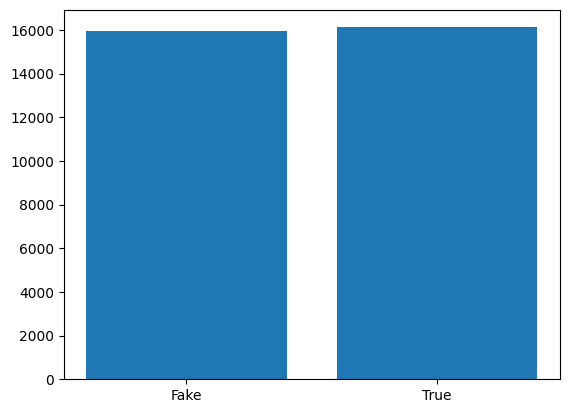

In [39]:
import matplotlib.pyplot as plt
classes = df.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

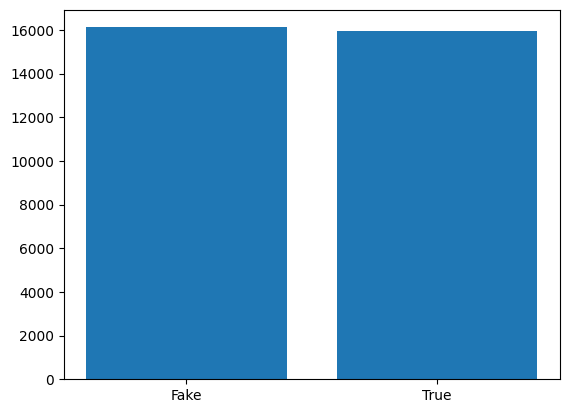

In [40]:
import matplotlib.pyplot as plt
classes = df1.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

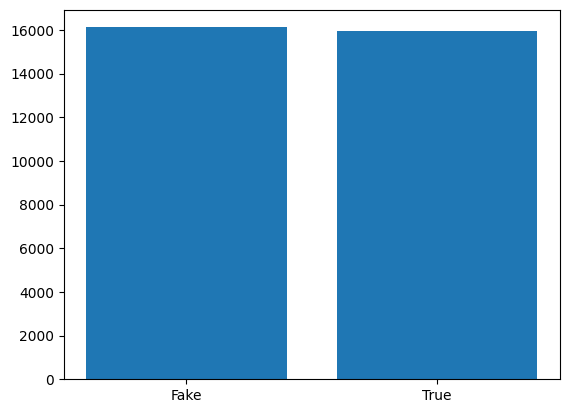

In [41]:
import matplotlib.pyplot as plt
classes = df2.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

In [42]:
train_text, temp_text, train_labels, temp_labels = train_test_split(df['data'],df['label'],
                                                                    random_state=2018,
                                                                    test_size=0.3,
                                                                    stratify=df['label'])

In [43]:
train_text.shape
temp_text.shape

(9621,)

In [44]:
temp_text.shape

(9621,)

In [45]:
train_labels.shape

(22449,)

In [46]:
temp_labels.shape

(9621,)

In [47]:
val_text_cov=df1.loc[:,"data"].values
val_labels_cov=df1.loc[:,"label"].values
test_text_cov=df2.loc[:,"data"].values
test_labels_cov=df2.loc[:,"label"].values

In [48]:
val_labels_cov[0]

0


Tokenizer
---



In [51]:
#from transformers import AutoTokenizer,TFAutoModel
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
device = torch.device("cuda")

In [52]:
model_name="bert-base-uncased"
bert = AutoModel.from_pretrained(model_name)
tokenizer = BertTokenizerFast.from_pretrained(model_name)

In [53]:
max_seq_len = 15
tokens_train = tokenizer.batch_encode_plus(
    train_text.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

In [54]:
tokens_train

{'input_ids': [[101, 4013, 8398, 24779, 8769, 2067, 7831, 3331, 18108, 21914, 102, 0, 0, 0, 0], [101, 4380, 2610, 8118, 5014, 2048, 2375, 12088, 27748, 15113, 102, 0, 0, 0, 0], [101, 8112, 12216, 4459, 15478, 15912, 2075, 6947, 4658, 4355, 2412, 2678, 102, 0, 0], [101, 22277, 2015, 3607, 2360, 2775, 19378, 8461, 10083, 2047, 2259, 2335, 102, 0, 0], [101, 6221, 8398, 6904, 21928, 2075, 3280, 2524, 4599, 10214, 4965, 2047, 2259, 2335, 102], [101, 5223, 4126, 28520, 4858, 2304, 2158, 20540, 16939, 2317, 2158, 27744, 3661, 3049, 102], [101, 8398, 3517, 23388, 4001, 3537, 14895, 12935, 13535, 5849, 1059, 2015, 3501, 102, 0], [101, 2178, 2663, 17212, 2050, 2457, 3513, 3655, 4047, 3282, 4808, 102, 0, 0, 0], [101, 8398, 4494, 2234, 10036, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 8398, 3632, 4895, 12053, 2098, 2220, 2851, 10474, 14841, 13662, 4491, 2976, 3648, 102], [101, 6703, 6752, 14855, 2497, 26632, 2078, 2159, 2731, 3105, 5427, 5290, 102, 0, 0], [101, 5796, 28957, 8133, 9010, 23025, 16360, 6

In [55]:
decode_1 = tokenizer.decode(tokens_train.input_ids[0])
print(decode_1)

[CLS] pro trump rocker fires back comparison talking apples grenades [SEP] [PAD] [PAD] [PAD] [PAD]


In [56]:
max_seq_len = 15
tokens_temp = tokenizer.batch_encode_plus(
    temp_text.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False,
    padding=True,
    return_tensors='tf',
    return_attention_mask = True,
    verbose = True
)

In [57]:
decode_temp = tokenizer.decode(tokens_temp.input_ids[0])

print(decode_temp)

[CLS] washington accuses russians bombing five hospitals syria state department refuses provide evidence [SEP]


In [58]:
max_seq_len=15
tokens_val = tokenizer.batch_encode_plus(
    val_text_cov.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)
tokens_test = tokenizer.batch_encode_plus(
    test_text_cov.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)


In [59]:
decode_2 = tokenizer.decode(tokens_val.input_ids[0])

print(decode_2)

[CLS] dr anthony fauci known years chloroquine hydro [SEP]


In [60]:
decode_3 = tokenizer.decode(tokens_test.input_ids[0])

print(decode_3)

[CLS] woman margaret keenan shown bbc cnn getting vaccinated october december [SEP] [PAD]


In [61]:
#tokens_train['input_ids'].shape

In [62]:
#tokens_train['attention_mask'].shape

In [63]:
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels.tolist())
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels_cov.tolist())
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels_cov.tolist())

In [64]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
batch_size = 4
train_data = TensorDataset(train_seq, train_mask, train_y)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)
val_data = TensorDataset(val_seq, val_mask, val_y)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

In [65]:
#y_train = train_labels.values
#y_train


Model
---



In [66]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy,BinaryCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy,BinaryAccuracy
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

In [67]:
for param in bert.parameters():
    param.requires_grad = False

In [68]:
class BERT_Arch(nn.Module):

    def __init__(self, bert):
      super(BERT_Arch, self).__init__()
      self.bert = bert
      self.dropout = nn.Dropout(0.1)
      self.relu =  nn.ReLU()
      self.fc1 = nn.Linear(768,512)
      self.fc2 = nn.Linear(512,2)
      self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, sent_id,mask):
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)
      #_, cls_hs = self.bert(sent_id, return_dict=False)
      x = self.fc1(cls_hs)
      x = self.relu(x)
      x = self.dropout(x)
      x = self.fc2(x)
      x = self.softmax(x)
      return x

In [69]:
device = torch.device("cuda")
model = BERT_Arch(bert)
model= model.to(device)

In [70]:
from transformers import AdamW
optimizer = AdamW(model.parameters(), lr = 2e-05)

In [71]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(train_labels),
                                        y = train_labels
                                    )
class_weights = dict(zip(np.unique(train_labels), class_weights))

li=[]
li.append(class_weights[0])
li.append(class_weights[1])
print(li)

[0.9946389011962783, 1.0054192045861698]


In [72]:
weights= torch.tensor(li,dtype=torch.float)
weights = weights.to(device)
cross_entropy  = nn.NLLLoss(weight=weights)
epochs = 20

In [ ]:
def train():
  model.train()
  total_loss, total_accuracy = 0, 0
  total_preds=[]
  for step,batch in enumerate(train_dataloader):
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))
    batch = [r.to(device) for r in batch]
    sent_id, mask, labels = batch
    model.zero_grad()
    preds = model(sent_id, mask)
    loss = cross_entropy(preds, labels)
    total_loss = total_loss + loss.item()
    loss.backward()
    #gradients are clipped to prevent the exploding gradient problem which is an unusual update in gradients during back propagation
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()
    preds=preds.detach().cpu().numpy()
    total_preds.append(preds)
  avg_loss = total_loss / len(train_dataloader)
  total_preds  = np.concatenate(total_preds, axis=0)
  return avg_loss, total_preds

In [ ]:
def evaluate():
  print("\nEvaluating...")
  model.eval()
  total_loss, total_accuracy = 0, 0
  total_preds = []
  for step,batch in enumerate(val_dataloader):
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))
    batch = [t.to(device) for t in batch]
    sent_id, mask, labels = batch
    #sent_id, labels = batch

    with torch.no_grad():
      preds = model(sent_id, mask)
      #preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)
      total_loss = total_loss + loss.item()
      preds = preds.detach().cpu().numpy()
      total_preds.append(preds)
  avg_loss = total_loss / len(val_dataloader)
  total_preds  = np.concatenate(total_preds, axis=0)
  return avg_loss, total_preds

In [ ]:
best_valid_loss = float('inf')
train_losses=[]
valid_losses=[]
for epoch in range(epochs):
    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))
    train_loss, _ = train()
    valid_loss, _ = evaluate()
    #weights of the model with the lowest validation loss are saved
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights.pt')
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')


 Epoch 1 / 20
  Batch    50  of  5,613.
  Batch   100  of  5,613.
  Batch   150  of  5,613.
  Batch   200  of  5,613.
  Batch   250  of  5,613.
  Batch   300  of  5,613.
  Batch   350  of  5,613.
  Batch   400  of  5,613.
  Batch   450  of  5,613.
  Batch   500  of  5,613.
  Batch   550  of  5,613.
  Batch   600  of  5,613.
  Batch   650  of  5,613.
  Batch   700  of  5,613.
  Batch   750  of  5,613.
  Batch   800  of  5,613.
  Batch   850  of  5,613.
  Batch   900  of  5,613.
  Batch   950  of  5,613.
  Batch 1,000  of  5,613.
  Batch 1,050  of  5,613.
  Batch 1,100  of  5,613.
  Batch 1,150  of  5,613.
  Batch 1,200  of  5,613.
  Batch 1,250  of  5,613.
  Batch 1,300  of  5,613.
  Batch 1,350  of  5,613.
  Batch 1,400  of  5,613.
  Batch 1,450  of  5,613.
  Batch 1,500  of  5,613.
  Batch 1,550  of  5,613.
  Batch 1,600  of  5,613.
  Batch 1,650  of  5,613.
  Batch 1,700  of  5,613.
  Batch 1,750  of  5,613.
  Batch 1,800  of  5,613.
  Batch 1,850  of  5,613.
  Batch 1,900  of  5,61

training

Validation covid data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_curve, auc

def evaluate_roc(probs, y_true):
    """
    - Print AUC and accuracy on the test set
    - Plot ROC
    @params    probs (np.array): an array of predicted probabilities with shape (len(y_true), 2)
    @params    y_true (np.array): an array of the true values with shape (len(y_true),)
    """
    preds = probs[:, 1]
    fpr, tpr, threshold = roc_curve(y_true, preds)
    roc_auc = auc(fpr, tpr)
    print(f'AUC: {roc_auc:.4f}')

    # Get accuracy over the test set
    y_pred = np.where(preds >= 0.5, 1, 0)
    accuracy = accuracy_score(y_true, y_pred)
    print(f'Accuracy: {accuracy*100:.2f}%')

    # Plot ROC AUC
    plt.figure(figsize=(8, 6))  # Increase the figure size if needed
    plt.plot(fpr, tpr, 'b', label='AUC = %0.2f, Accuracy = %0.2f%%' % (roc_auc, accuracy*100))
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.xlabel('False Positive Rate', fontsize=20)  # Increase the font size here
    plt.ylabel('True Positive Rate', fontsize=20)  # Increase the font size here
    plt.title('Receiver Operating Characteristic', fontsize=24)  # Increase the font size here
    plt.legend(loc='lower right', fontsize=12)  # You can also increase the font size for the legend if needed
    plt.grid(True)  # Add grid lines
    plt.show()


In [ ]:
#model.load_state_dict(torch.load(path))
with torch.no_grad():
  preds = model(train_seq.to(device),train_mask.to(device))
  preds1 = preds.detach().cpu().numpy()
preds = np.argmax(preds1, axis = 1)
test_y = torch.tensor(train_labels.tolist())
print(classification_report(test_y, preds))

In [ ]:
import torch.nn.functional as F
prb = torch.from_numpy(preds1)
probs = F.softmax(prb, dim=1).cpu().numpy()

In [ ]:
evaluate_roc(probs, test_y)

In [ ]:
#model.load_state_dict(torch.load(path))
with torch.no_grad():
  preds = model(val_seq.to(device),val_mask.to(device))
  preds2 = preds.detach().cpu().numpy()
preds = np.argmax(preds2, axis = 1)
test_y = torch.tensor(val_labels_cov.tolist())
print(classification_report(test_y, preds))

              precision    recall  f1-score   support

           0       0.56      0.31      0.40      4401
           1       0.53      0.77      0.63      4542

    accuracy                           0.54      8943
   macro avg       0.55      0.54      0.52      8943
weighted avg       0.55      0.54      0.52      8943



In [ ]:
import torch.nn.functional as F
prb = torch.from_numpy(preds2)
probs = F.softmax(prb, dim=1).cpu().numpy()

In [ ]:
preds = probs[:, 1]
y_pred = np.where(preds >= 0.5, 1, 0)

In [ ]:
df1['y_pred'] = y_pred.tolist()

In [ ]:
df1.to_csv("exp3_results.csv")

AUC: 0.6596
Accuracy: 59.53%


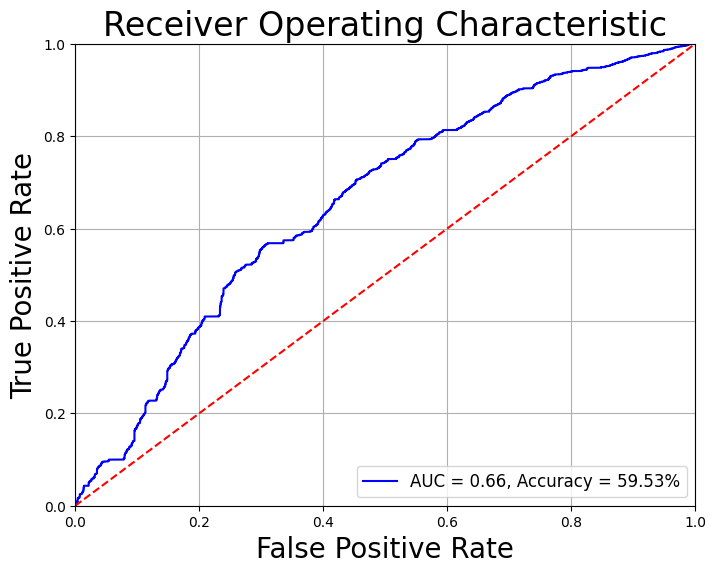

In [ ]:
evaluate_roc(probs, test_y)

test covid data

In [ ]:
#model.load_state_dict(torch.load(path))
with torch.no_grad():
  preds = model(test_seq.to(device),test_mask.to(device))
  preds3 = preds.detach().cpu().numpy()
preds = np.argmax(preds3, axis = 1)
test_y = torch.tensor(test_labels_cov.tolist())
print(classification_report(test_y, preds))

              precision    recall  f1-score   support

           0       0.75      0.27      0.40      1799
           1       0.54      0.90      0.67      1679

    accuracy                           0.58      3478
   macro avg       0.64      0.59      0.54      3478
weighted avg       0.65      0.58      0.53      3478



In [ ]:
import torch.nn.functional as F
prb = torch.from_numpy(preds3)
probs = F.softmax(prb, dim=1).cpu().numpy()

AUC: 0.6686
Accuracy: 57.56%


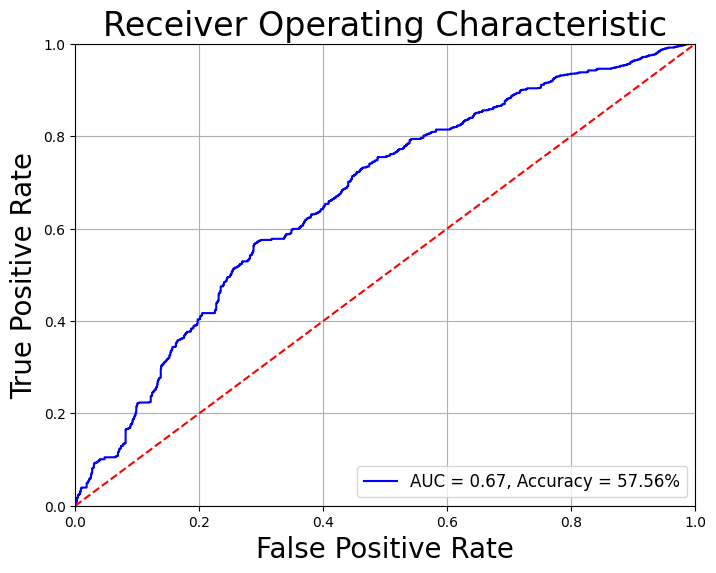

In [ ]:
evaluate_roc(probs, test_y)

Test

Model_Saving
---

In [75]:
path = 'saved_weights.pt'
model.load_state_dict(torch.load(path))

<All keys matched successfully>


LIME
---



In [76]:
# for LIME import necessary packages
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from sklearn.linear_model import Ridge, lars_path
from lime.lime_text import explanation
from functools import partial
import scipy as sp
from sklearn.utils import check_random_state
import numpy as np
import lime
import torch
import torch.nn.functional as F
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

In [77]:
class_names = ['Real','Fake']
explainer1 = LimeTextExplainer(class_names=class_names)

In [78]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

In [79]:
def predict_probab(x):
    input_ids,attention_mask=tokenize_bert(x)
    preds = model(input_ids.to(device),attention_mask.to(device))
    preds = preds.detach().cpu().numpy()
    scores = (np.exp(preds).T / np.exp(preds).sum(-1)).T
    t = torch.from_numpy(scores)
    val = t.softmax(1).detach().numpy()#softmax(1)
    return val

**Text for explanation**

1.   True Positive - "coronavirus contains hiv insertions stoking fears artificially created bioweapon zero hedge "
2.  True negative -"  new coronavirus can not transmitted mosquito bites"
3.   False Negative -"benefits hemp seed oil great health anti inflammation enhanced immune cannabis"
4.    False positive - "  taking hot bath prevent new coronavirus disease taking hot bath prevent     "


True Positive

In [80]:
True_Positive ="coronavirus contains hiv insertions stoking fears artificially created bioweapon zero hedge"


In [81]:
TP_exp = explainer1.explain_instance(True_Positive, predict_probab, num_features=10, num_samples=len(True_Positive))

In [82]:
TP_exp.show_in_notebook()

In [83]:
TP_exp.as_list()

[('fears', -0.045920926521459765),
 ('stoking', -0.04095973260325633),
 ('zero', -0.028181112647967754),
 ('created', -0.025579388051483243),
 ('hedge', -0.02528794375469204),
 ('bioweapon', -0.022617934448465264),
 ('artificially', -0.019732805604971478),
 ('coronavirus', 0.017115588620475932),
 ('hiv', 0.010720072990836431),
 ('insertions', -0.0029699309635253072)]

True Negative

In [84]:
True_Negative ="new coronavirus can not transmitted mosquito bites"

In [85]:
TN_exp = explainer1.explain_instance(True_Negative, predict_probab, num_features=100, num_samples=len(True_Negative))

In [86]:
TN_exp.show_in_notebook()

In [87]:
TN_exp.as_list()

[('coronavirus', -0.03240628512174429),
 ('new', -0.029467973834659746),
 ('not', -0.025602952278532775),
 ('bites', -0.017723791225243517),
 ('transmitted', 0.014618216914115066),
 ('mosquito', -0.010840130606361048),
 ('can', 0.007798886314871676)]

False Positive

In [88]:
False_Positive ="benefits hemp seed oil great health anti inflammation enhanced immune cannabis" #False

In [89]:
FP_exp = explainer1.explain_instance(False_Positive, predict_probab, num_features=100, num_samples=len(False_Positive))

In [90]:
FP_exp.show_in_notebook()

In [91]:
FP_exp.as_list()

[('benefits', 0.03397003617721433),
 ('great', -0.023455208878800114),
 ('anti', -0.022578076972009902),
 ('cannabis', 0.01680341172590803),
 ('hemp', -0.01047229263311309),
 ('immune', -0.009028342576605954),
 ('enhanced', 0.006598400046117873),
 ('oil', 0.005850847836574119),
 ('health', -0.004648515152291502),
 ('inflammation', 0.004286566525250839),
 ('seed', -0.001015183957245563)]

False Negative

In [92]:
False_Negative ="taking hot bath prevent new coronavirus disease taking hot bath prevent "

In [93]:
FN_exp = explainer1.explain_instance(False_Negative, predict_probab, num_features=100, num_samples=150)

In [94]:
FN_exp.show_in_notebook()

In [95]:
FN_exp.as_list()

[('prevent', 0.11477256164559448),
 ('bath', -0.08487267297768415),
 ('coronavirus', -0.07396387719673884),
 ('hot', -0.0633574254282766),
 ('taking', -0.06263567410132644),
 ('disease', 0.024814166595996317),
 ('new', -0.0074886845029535085)]

**ELI5**
---

In [96]:
import scipy as sp
import torch.nn.functional as F

In [97]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

In [98]:
import torch.nn.functional as F
def predict_probab(x):
  input_ids,attention_mask=tokenize_bert(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [99]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Positive, predict_probab)
print(True_Positive)
te.show_prediction()

coronavirus contains hiv insertions stoking fears artificially created bioweapon zero hedge


In [100]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Negative, predict_probab)
print(True_Negative)
te.show_prediction(target_names=["Real","Fake"])

new coronavirus can not transmitted mosquito bites


In [101]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Positive, predict_probab)
print(False_Positive)
te.show_prediction(target_names=["Real","Fake"])

benefits hemp seed oil great health anti inflammation enhanced immune cannabis


In [102]:
te.show_weights(top=20)

Weight?,Feature
+0.578,<BIAS>
+0.500,x15
+0.435,x0
+0.430,x4
+0.402,x17
+0.392,x11
+0.351,x13
+0.286,x2
+0.265,x19
+0.174,x5


In [103]:
import eli5
from eli5.lime import TextExplainer


te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Negative, predict_probab)
print(False_Negative)
te.show_prediction(target_names=["Real","Fake"])

taking hot bath prevent new coronavirus disease taking hot bath prevent 


In [104]:
te.show_weights(top=20)

Weight?,Feature
+0.532,<BIAS>
+0.508,x4
+0.501,x10
+0.242,x1
+0.198,x13
+0.103,x8
-0.285,x7
-0.338,x0
-0.458,x12
-0.527,x5


**Anchor**
---

In [105]:
!pip install alibi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.2/524.2 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 11.3 MB/s eta 0:00:00


In [106]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
import spacy
import string
import numpy as np
import numpy as np
np.random.seed(1)
import sys
import sklearn
import sklearn.ensemble
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from alibi.explainers import AnchorText
from alibi.datasets import fetch_movie_sentiment
from alibi.utils import spacy_model
from alibi.utils import DistilbertBaseUncased, BertBaseUncased, RobertaBase

In [107]:
model1 = 'en_core_web_md'
spacy_model(model=model1)
nlp = spacy.load(model1)

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ As of spaCy v3.0, model symlinks are not supported anymore. You can
load trained pipeline packages using their full names or from a directory
path.


In [108]:
def tokenize_berta(x):
  tokens_test_temp = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq_temp = torch.tensor(tokens_test_temp['input_ids'])
  test_mask_temp = torch.tensor(tokens_test_temp['attention_mask'])
  return test_seq_temp,test_mask_temp

In [109]:
def predict_probab_anchor_max(x):
  #for i in x:
  input_ids,attention_mask=tokenize_berta(x)
  preds = model(input_ids.to(device),attention_mask.to(device))
  preds = preds.detach().cpu().numpy()
  tt = torch.from_numpy(preds)
  pred1 = np.argmax(tt, axis = 1)
  return np.array(pred1)

In [110]:
#class_names = df2.label
class_names=["Real","Fake"]
print(class_names)
# select instance to be explained
text = "Trump looms behind both Obama and Haley speeches"
print("* Text: %s" % text)

#data=df2.data
# compute class prediction
pred = class_names[predict_probab_anchor_max(text)[0]]
alternative =  class_names[1 - predict_probab_anchor_max(text)[0]]
print("* Prediction: %s" % pred)
print("* alternative: %s" % alternative)

['Real', 'Fake']
* Text: Trump looms behind both Obama and Haley speeches
* Prediction: Fake
* alternative: Real


In [111]:
explanation

<module 'lime.explanation' from '/usr/local/lib/python3.10/dist-packages/lime/explanation.py'>

In [112]:
language_model =BertBaseUncased()

All PyTorch model weights were used when initializing TFBertForMaskedLM.

All the weights of TFBertForMaskedLM were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertForMaskedLM for predictions without further training.


In [113]:
explainer = AnchorText(
    predictor=predict_probab_anchor_max,
    sampling_strategy="language_model",   # use language model to predict the masked words
    language_model=language_model,        # language model to be used
    filling="parallel",                   # just one pass through the transformer
    sample_proba=0.5,                     # probability of masking a word
    frac_mask_templates=0.1,              # fraction of masking templates (smaller value -> faster, less diverse)
    use_proba=True,                       # use words distribution when sampling (if False sample uniform)
    top_n=20,                             # consider the fist 20 most likely words
    temperature=1.0,                      # higher temperature implies more randomness when sampling
    stopwords=['and', 'a', 'but', 'in'],  # those words will not be sampled
    batch_size_lm=32,                     # language model maximum batch size
)

In [114]:
explanation = explainer.explain(True_Positive, threshold=0.95)

In [115]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: fears AND zero
Precision: 0.95

Examples where anchor applies and model predicts Fake:
coronavirus human is health health fears artificially infected bioweapon zero in
coronavirus in and whose medical fears artificially caused bioweapon zero ।
coronavirus as and health of fears artificially created bioweapon zero via
coronavirus for virus human vaccine fears artificially created bioweapon zero for
coronavirus and its health medical fears artificially created bioweapon zero on
coronavirus and and and technology fears artificially from bioweapon zero in
coronavirus is human health human fears artificially generated bioweapon zero via
coronavirus and and virus for fears artificially from bioweapon zero ।
coronavirus uses and and system fears artificially activate bioweapon zero from
coronavirus virus and and and fears artificially created bioweapon zero for

Examples where anchor applies and model predicts Real:
coronavirus contains hiv insertions for fears of of bioweapon zero se

In [116]:
explanation = explainer.explain(True_Negative, threshold=0.95)

In [117]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: transmitted
Precision: 0.98

Examples where anchor applies and model predicts Fake:
the information can be transmitted easily ।
the noise can be transmitted directly only
new messages can be transmitted anywhere ।
no data can be transmitted anywhere if
other files can be transmitted anywhere ।
the information can be transmitted anywhere as
this services can be transmitted here a
the it can be transmitted electronically if
no signals can be transmitted freely so
no information can be transmitted easily as

Examples where anchor applies and model predicts Real:
this coronavirus can not transmitted normally but
new coronavirus are and transmitted diseases bites
new coronavirus the the transmitted mosquito ।
this coronavirus can not transmitted mosquito species


In [118]:
explanation = explainer.explain(False_Positive, threshold=0.95)

In [119]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: 
Precision: 0.99

Examples where anchor applies and model predicts Fake:


IndexError: ignored

In [ ]:
explanation = explainer.explain(False_Negative, threshold=0.95)

In [ ]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

**SHAP**
---

In [120]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 6.6 MB/s eta 0:00:00


In [121]:
!pip install nlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.3 MB/s eta 0:00:00


In [122]:
dfdd=pd.read_csv("SHAP_Exp_cases2.csv")
dfdd

,text,label,Pred
0,coronavirus contains hiv insertions stoking fe...,0,0
1,new coronavirus can not transmitted mosquito b...,1,1
2,benefits hemp seed oil great health anti infla...,1,0
3,taking hot bath prevent new coronavirus diseas...,0,1


In [123]:
from nlp import Dataset
df3=pd.DataFrame({"label":[],"text":[]})
df3["label"]=dfdd.loc[:]["label"]
df3["text"]=dfdd.loc[:]["text"]
dataset = Dataset.from_pandas(df3)
#dataset[:2]

In [124]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

In [125]:
def predict_probab(x):
    input_ids,attention_mask=tokenize_bert(x)
    preds = model(input_ids.to(device),attention_mask.to(device))
    preds = preds.detach().cpu().numpy()
    scores = (np.exp(preds).T / np.exp(preds).sum(-1)).T
    val = sp.special.logit(scores[:,1])
    return val

In [126]:
import shap
import transformers
import nlp
import torch
import numpy as np
import scipy as sp
explainer = shap.Explainer(predict_probab, tokenizer)

shap_values = explainer(dataset, fixed_context=1)

In [127]:
shap.plots.text(shap_values[:1])

In [128]:
shap.plots.text(shap_values[1:2])

In [129]:
shap.plots.text(shap_values[2:3])

In [130]:
shap.plots.text(shap_values[3:4])